In [43]:
!pip install duckdb
!pip install seaborn


[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


Dataset is a real manufacturing iot  dataset from kaggle
consisting of 5O machine ids and their various readings 

In [1]:
import polars as pl 

In [5]:
iot_data = "/Users/brighttenkorangofori/Desktop/projects/industry4.0/src/data/raw/smart_manufacturing_data.csv"
df = pl.read_csv(iot_data)
df.head(10)

timestamp,machine_id,temperature,vibration,humidity,pressure,energy_consumption,machine_status,anomaly_flag,predicted_remaining_life,failure_type,downtime_risk,maintenance_required
str,i64,f64,f64,f64,f64,f64,i64,i64,i64,str,f64,i64
"""2025-01-01 00:00:00""",39,78.61,28.65,79.96,3.73,2.16,1,0,106,"""Normal""",0.0,0
"""2025-01-01 00:01:00""",29,68.19,57.28,35.94,3.64,0.69,1,0,320,"""Normal""",0.0,0
"""2025-01-01 00:02:00""",15,98.94,50.2,72.06,1.0,2.49,1,1,19,"""Normal""",1.0,1
"""2025-01-01 00:03:00""",43,90.91,37.65,30.34,3.15,4.96,1,1,10,"""Normal""",1.0,1
"""2025-01-01 00:04:00""",8,72.32,40.69,56.71,2.68,0.63,2,0,65,"""Vibration Issue""",0.0,1
"""2025-01-01 00:05:00""",21,70.88,38.38,51.01,3.19,3.24,1,0,381,"""Normal""",0.0,0
"""2025-01-01 00:06:00""",39,73.05,40.7,61.59,2.35,1.63,1,0,470,"""Normal""",0.0,0
"""2025-01-01 00:07:00""",19,90.0,56.52,48.32,3.3,3.3,1,0,136,"""Normal""",0.0,0
"""2025-01-01 00:08:00""",23,96.04,24.98,50.47,1.59,3.08,1,1,38,"""Normal""",1.0,1


In [10]:
df['downtime_risk'].unique()

downtime_risk
f64
0.0
0.88
0.92
0.93
0.94
0.97
0.98
0.99
1.0


In [ ]:
df['downtime_risk'].describe()

statistic,value
str,f64
"""count""",100000.0
"""null_count""",0.0
"""mean""",0.0891552
"""std""",0.284961
"""min""",0.0
"""25%""",0.0
"""50%""",0.0
"""75%""",0.0
"""max""",1.0


In [140]:
print('Total records:', len(df))
print('Anomalies:', df.filter(pl.col('anomaly_flag') == 1).height)
print('Maintenance required:', df.filter(pl.col('maintenance_required') == 1).height)
print('Failure types:', df['failure_type'].value_counts())

Total records: 100000
Anomalies: 8916
Maintenance required: 19697
Failure types: shape: (5, 2)
┌──────────────────┬───────┐
│ failure_type     ┆ count │
│ ---              ┆ ---   │
│ str              ┆ u32   │
╞══════════════════╪═══════╡
│ Vibration Issue  ┆ 3129  │
│ Pressure Drop    ┆ 1969  │
│ Overheating      ┆ 1989  │
│ Normal           ┆ 91899 │
│ Electrical Fault ┆ 1014  │
└──────────────────┴───────┘


In [142]:
df['anomaly_flag'].describe()

statistic,value
str,f64
"""count""",100000.0
"""null_count""",0.0
"""mean""",0.08916
"""std""",0.284976
"""min""",0.0
"""25%""",0.0
"""50%""",0.0
"""75%""",0.0
"""max""",1.0


In [159]:
anomaly_pandas = df['anomaly_flag'].to_pandas().value_counts().to_dict()
print(anomaly_pandas)

{0: 91084, 1: 8916}


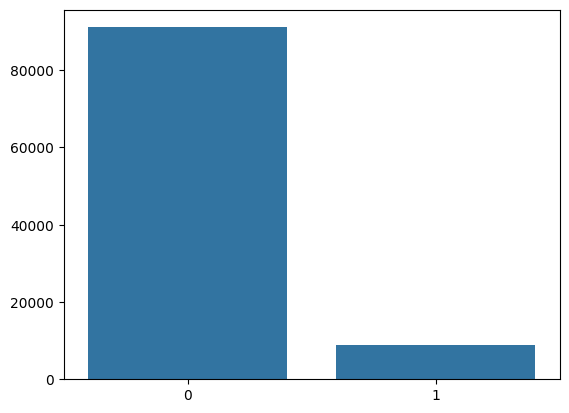

In [ ]:

sns.barplot(x = anomaly_pandas.keys(), y = anomaly_pandas.values())
plt.show()



             

-data is skewed but good for anamaly detection 

-Balanced enough for training anomaly detection models

-Sufficient anomalies to learn patterns
R
-ealistic class imbalance (common in manufacturing)

In [ ]:
df['downtime_risk'].describe()

statistic,value
str,f64
"""count""",100000.0
"""null_count""",0.0
"""mean""",0.0891552
"""std""",0.284961
"""min""",0.0
"""25%""",0.0
"""50%""",0.0
"""75%""",0.0
"""max""",1.0


In [ ]:
df['downtime_risk'].describe()

statistic,value
str,f64
"""count""",100000.0
"""null_count""",0.0
"""mean""",0.0891552
"""std""",0.284961
"""min""",0.0
"""25%""",0.0
"""50%""",0.0
"""75%""",0.0
"""max""",1.0


In [46]:
sample_size_for_first_50 = len(df.head(50)['machine_id'].unique()) 
print(f"machine distribution for first 50 is {sample_size_for_first_50}")




machine distribution for first 50 is 35


this shows that 35 machines were sampled for first 50 picks 
which is 70% of the total machines 
good sample

In [47]:
df2 = df.clone() #making a clone so i can work on the original dataframe

In [48]:
df.describe()

statistic,timestamp,machine_id,temperature,vibration,humidity,pressure,energy_consumption,machine_status,anomaly_flag,predicted_remaining_life,failure_type,downtime_risk,maintenance_required
str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,str,f64,f64
"""count""","""100000""",100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,100000.0,"""100000""",100000.0,100000.0
"""null_count""","""0""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""0""",0.0,0.0
"""mean""",null,25.49933,75.015625,50.01227,54.995401,3.0004047,2.7470643,1.00205,0.08916,234.26916,null,0.0891552,0.19697
"""std""",null,14.389439,10.031884,14.985444,14.43796,1.152399,1.297865,0.446193,0.284976,150.063062,null,0.284961,0.397711
"""min""","""2025-01-01 00:00:00""",1.0,35.55,-17.09,30.0,1.0,0.5,0.0,0.0,1.0,"""Electrical Fault""",0.0,0.0
"""25%""",null,13.0,68.27,39.97,42.52,2.0,1.63,1.0,0.0,97.0,null,0.0,0.0
"""50%""",null,25.0,75.06,49.96,54.98,3.01,2.74,1.0,0.0,230.0,null,0.0,0.0
"""75%""",null,38.0,81.75,60.1,67.5,4.0,3.87,1.0,0.0,365.0,null,0.0,0.0
"""max""","""2025-03-11 10:39:00""",50.0,121.94,113.8,80.0,5.0,5.0,2.0,1.0,499.0,"""Vibration Issue""",1.0,1.0


 insights
- no null values 
- 100000 rows 
- timestamp in string format and not datetime
- 50 unique machines 
- all other column have the right data type 
- machine status shuld be encoded 
- predcited life most probably in months


In [49]:
#converting the timestamp column to datetime format for analysis
df = df.with_columns(
    pl.col("timestamp").str.to_datetime().alias("timestamp")
)

In [50]:
df.schema['timestamp'] #now converted to datetime format

Datetime(time_unit='us', time_zone=None)

In [78]:
min_time = df['timestamp'].min()
max_time = df['timestamp'].max()
no_of_days = (max_time - min_time).days

In [51]:
import matplotlib.pyplot as plt

lets analyze key sensor data trend for all machines for the entire time period

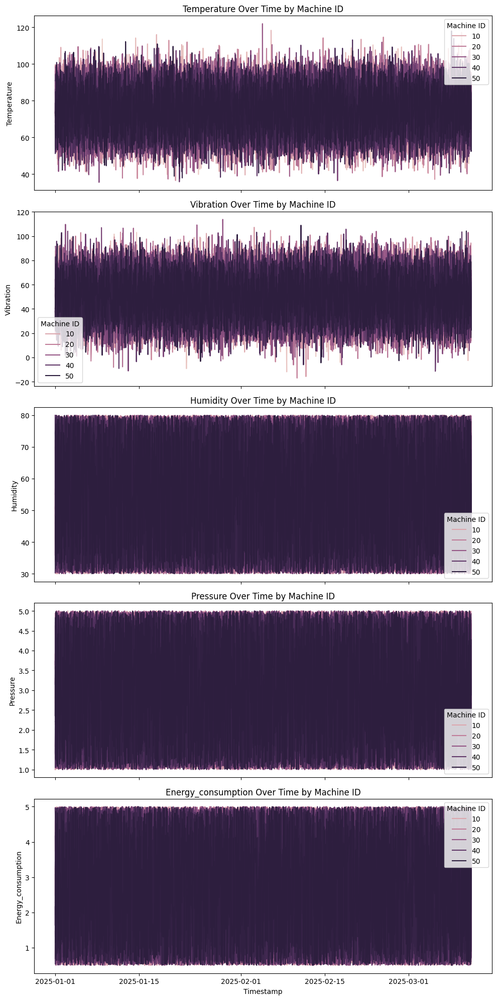

In [53]:
import seaborn as sns

# Convert Polars DataFrame to pandas for Seaborn
df_pandas = df.to_pandas()


columns = ['temperature', 'vibration', 'humidity', 'pressure', 'energy_consumption']

# Create a figure with subplots (one for each column)
fig, axes = plt.subplots(nrows=len(columns), ncols=1, figsize=(10, 4 * len(columns)), sharex=True)

# Plot each column in a separate subplot
for i, column in enumerate(columns):
    sns.lineplot(data=df_pandas, x='timestamp', y=column, hue='machine_id', ax=axes[i])
    axes[i].set_title(f'{column.capitalize()} Over Time by Machine ID')
    axes[i].set_ylabel(column.capitalize())
    axes[i].legend(title='Machine ID')

# Set x-axis label for the bottom subplot
axes[-1].set_xlabel('Timestamp')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [79]:
#50 machine plot looks cluttterd to lets sample 
import random
random.seed(42)

df.sample(10)

TypeError: 'int' object is not callable

<h3>for a better data representation lets analyze each machine ona different plot and compare them
ploting key columns = ['temperature', 'vibration', 'humidity', 'pressure', 'energy_consumption'] for every machine id </h3>

In [55]:
df.columns

['timestamp',
 'machine_id',
 'temperature',
 'vibration',
 'humidity',
 'pressure',
 'energy_consumption',
 'machine_status',
 'anomaly_flag',
 'predicted_remaining_life',
 'failure_type',
 'downtime_risk',
 'maintenance_required']

In [56]:
df['temperature'].describe()

statistic,value
str,f64
"""count""",100000.0
"""null_count""",0.0
"""mean""",75.015625
"""std""",10.031884
"""min""",35.55
"""25%""",68.27
"""50%""",75.06
"""75%""",81.75
"""max""",121.94


In [57]:
columns_to_plot = ['temperature', 'vibration', 'humidity', 'pressure', 'energy_consumption']
for  column in columns_to_plot:
    print(f"Column: {column}")
    print(df[column].describe())

    



Column: temperature
shape: (9, 2)
┌────────────┬───────────┐
│ statistic  ┆ value     │
│ ---        ┆ ---       │
│ str        ┆ f64       │
╞════════════╪═══════════╡
│ count      ┆ 100000.0  │
│ null_count ┆ 0.0       │
│ mean       ┆ 75.015625 │
│ std        ┆ 10.031884 │
│ min        ┆ 35.55     │
│ 25%        ┆ 68.27     │
│ 50%        ┆ 75.06     │
│ 75%        ┆ 81.75     │
│ max        ┆ 121.94    │
└────────────┴───────────┘
Column: vibration
shape: (9, 2)
┌────────────┬───────────┐
│ statistic  ┆ value     │
│ ---        ┆ ---       │
│ str        ┆ f64       │
╞════════════╪═══════════╡
│ count      ┆ 100000.0  │
│ null_count ┆ 0.0       │
│ mean       ┆ 50.01227  │
│ std        ┆ 14.985444 │
│ min        ┆ -17.09    │
│ 25%        ┆ 39.97     │
│ 50%        ┆ 49.96     │
│ 75%        ┆ 60.1      │
│ max        ┆ 113.8     │
└────────────┴───────────┘
Column: humidity
shape: (9, 2)
┌────────────┬───────────┐
│ statistic  ┆ value     │
│ ---        ┆ ---       │
│ str       

/var/folders/9m/fk8nf0sd56b7drjkrkbjx7580000gn/T/ipykernel_66800/275590701.py:4: DeprecationWarning: the argument `by` for `DataFrame.group_by_dynamic` is deprecated. It was renamed to `group_by` in version 0.20.14.
  df_temp_daily = df.group_by_dynamic(


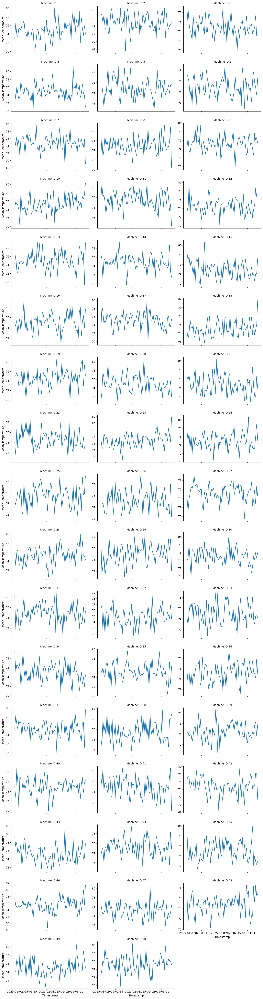

In [58]:
#plotting temperature for each machine id
import seaborn as sns
# Aggregate to daily means
df_temp_daily = df.group_by_dynamic(
    index_column="timestamp",
    every="1d",
    by="machine_id"
).agg(
    pl.col("temperature").mean().alias("mean_temperature")
)

# Convert to pandas for Seaborn
df_pandas = df_temp_daily.to_pandas()

# Create a faceted plot
g = sns.relplot(
    data=df_pandas,
    x="timestamp",
    y="mean_temperature",
    col="machine_id",
    col_wrap=3,  # Number of columns in the facet grid
    kind="line",
    height=3,
    aspect=1.5,
    facet_kws={'sharey': False}  # Allow different y-axes per facet
)


g.set_titles("Machine ID {col_name}")
g.set_axis_labels("Timestamp", "Mean Temperature")
plt.tight_layout()
plt.show()

In [ ]:
#sampling 10 machines and plotting their vibration for each day
df_vibe_daily = df.group_by_dynamic( 
    index_column="timestamp",
    every="1d",
    by=df['machine_id'][':10']
).agg(
    pl.col("vibration").mean().alias("mean_vibration")
)
print(df_vibe_daily)

shape: (10, 3)
┌────────────┬─────────────────────┬────────────────┐
│ machine_id ┆ timestamp           ┆ mean_vibration │
│ ---        ┆ ---                 ┆ ---            │
│ i64        ┆ datetime[μs]        ┆ f64            │
╞════════════╪═════════════════════╪════════════════╡
│ 12         ┆ 2025-01-01 00:00:00 ┆ 28.65          │
│ 13         ┆ 2025-01-01 00:00:00 ┆ 24.98          │
│ 14         ┆ 2025-01-01 00:00:00 ┆ 57.28          │
│ 18         ┆ 2025-01-01 00:00:00 ┆ 40.69          │
│ 22         ┆ 2025-01-01 00:00:00 ┆ 49.29          │
│ 23         ┆ 2025-01-01 00:00:00 ┆ 50.2           │
│ 29         ┆ 2025-01-01 00:00:00 ┆ 56.52          │
│ 31         ┆ 2025-01-01 00:00:00 ┆ 37.65          │
│ 43         ┆ 2025-01-01 00:00:00 ┆ 40.7           │
│ 48         ┆ 2025-01-01 00:00:00 ┆ 38.38          │
└────────────┴─────────────────────┴────────────────┘


/var/folders/9m/fk8nf0sd56b7drjkrkbjx7580000gn/T/ipykernel_66800/2980805876.py:2: DeprecationWarning: the argument `by` for `DataFrame.group_by_dynamic` is deprecated. It was renamed to `group_by` in version 0.20.14.
  df_vibe_daily = df.group_by_dynamic(


/var/folders/9m/fk8nf0sd56b7drjkrkbjx7580000gn/T/ipykernel_66800/2226723024.py:6: DeprecationWarning: the argument `by` for `DataFrame.group_by_dynamic` is deprecated. It was renamed to `group_by` in version 0.20.14.
  df_vibe_daily = df.group_by_dynamic(


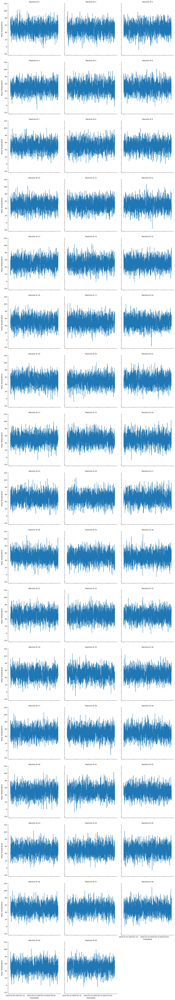

In [80]:
#plotting temperature for each machine id
import seaborn as sns
# Aggregate to daily means


df_vibe_daily = df.group_by_dynamic( 
    index_column="timestamp",
    every="1d",
    by="machine_id"
).agg(
    pl.col("vibration").mean().alias("mean_vibration")
)

g = sns.relplot(
    data=df,
    x="timestamp",
    y="vibration",
    col="machine_id",
    col_wrap=3,
    kind="line",
)


g.set_titles("Machine ID {col_name}")
g.set_axis_labels("Timestamp", "Mean Temperature")
plt.tight_layout()
plt.show()

In [61]:
mean_vibration_for_equipments = df.group_by_dynamic(
    index_column=df['timestamp'],
    every='1d',
    group_by = 'machine_id' # Changed 'by' to 'group_by'
    ).agg(pl.col('vibration').mean().sort(descending=True).alias('mean_vibration'))

df_mean_vibration = mean_vibration_for_equipments.to_pandas()
print(df_mean_vibration)




      machine_id  timestamp  mean_vibration
0              1 2025-01-01       51.107941
1              1 2025-01-02       50.997391
2              1 2025-01-03       49.227083
3              1 2025-01-04       54.487000
4              1 2025-01-05       51.541304
...          ...        ...             ...
3495          50 2025-03-07       49.369474
3496          50 2025-03-08       49.834167
3497          50 2025-03-09       52.868636
3498          50 2025-03-10       51.518387
3499          50 2025-03-11       52.373846

[3500 rows x 3 columns]


<h3>mean vibration seasonal decomposition and trends for all 50 ids with timestamp grouped into days<h3>

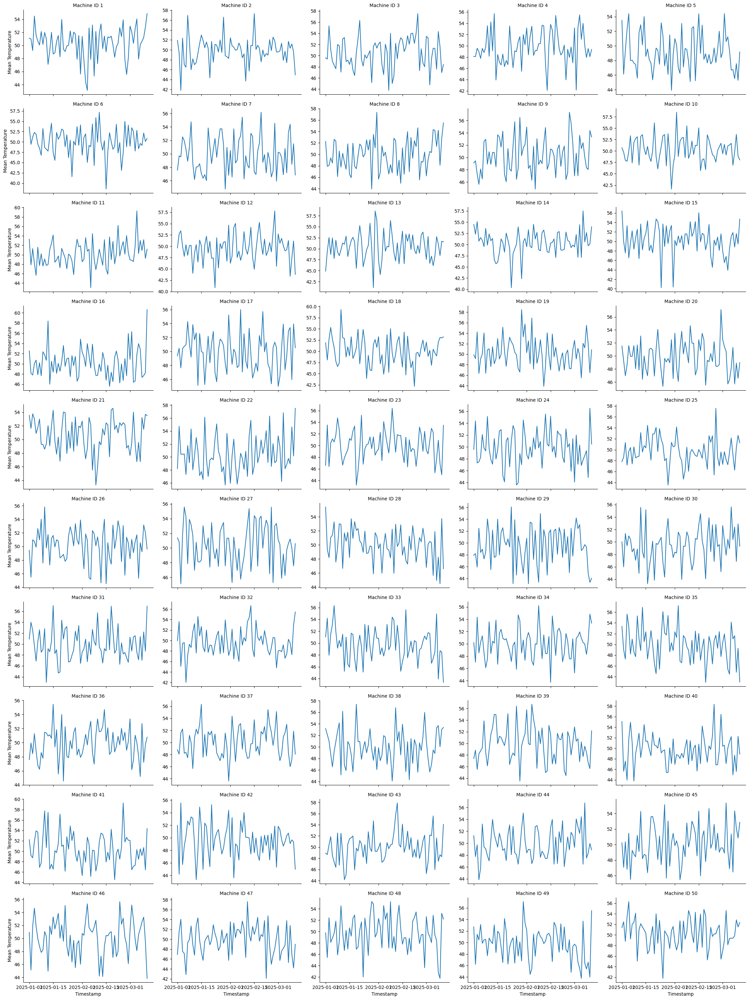

In [ ]:
#plot 
g = sns.relplot(
    data = df_mean_vibration,
    x= 'timestamp',
    y = 'mean_vibration',
    kind = 'line',
    col = 'machine_id',
    col_wrap = 5,
    facet_kws = {'sharey':False},
    height = 3,
    aspect = 1.5 )

g.set_titles()
g.set_titles("Machine ID {col_name}")
g.set_axis_labels("Timestamp", "Mean Temperature")
plt.tight_layout()
plt.show()


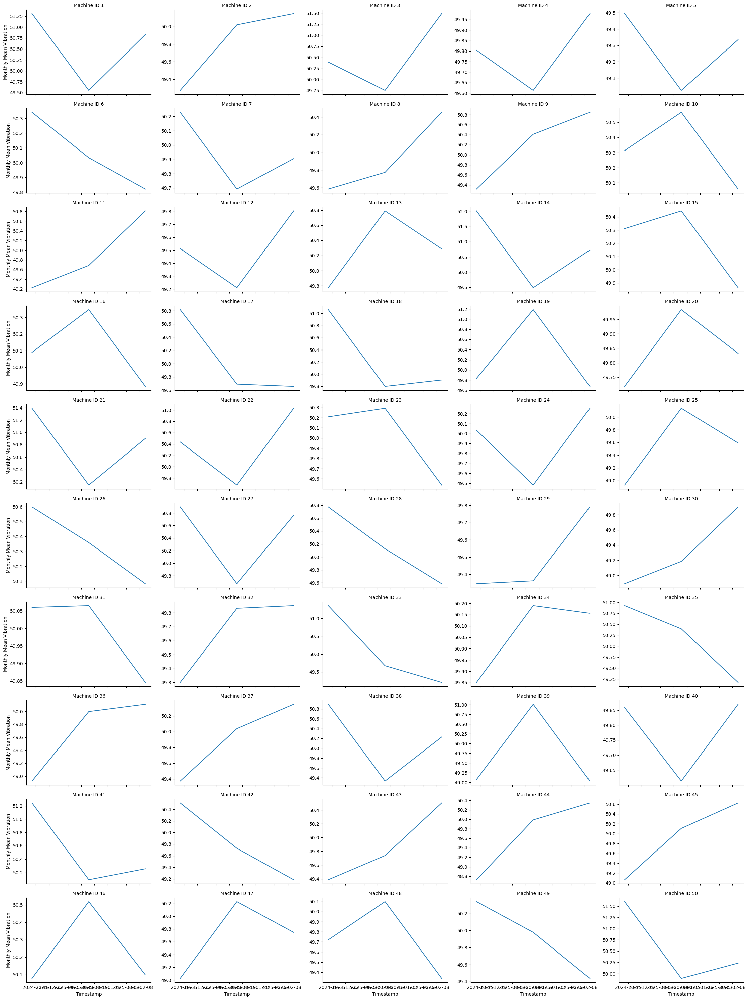

In [134]:
mean_vibration_for_equipments_monthly = df.group_by_dynamic(
    index_column=df['timestamp'],
    every='30d',
    group_by = 'machine_id' # Changed 'by' to 'group_by'
    ).agg(pl.col('vibration').mean().sort(descending=True).alias('mean_vibration'))

g = sns.relplot(
    data = mean_vibration_for_equipments_monthly,
    x= 'timestamp',
    y = 'mean_vibration',
    kind = 'line',
    col = 'machine_id',
    col_wrap = 5,
    facet_kws = {'sharey':False},
    height = 3,
    aspect = 1.5 )

g.set_titles()
g.set_titles("Machine ID {col_name}")
g.set_axis_labels("Timestamp", "Monthly Mean Vibration")
plt.tight_layout()
plt.show()


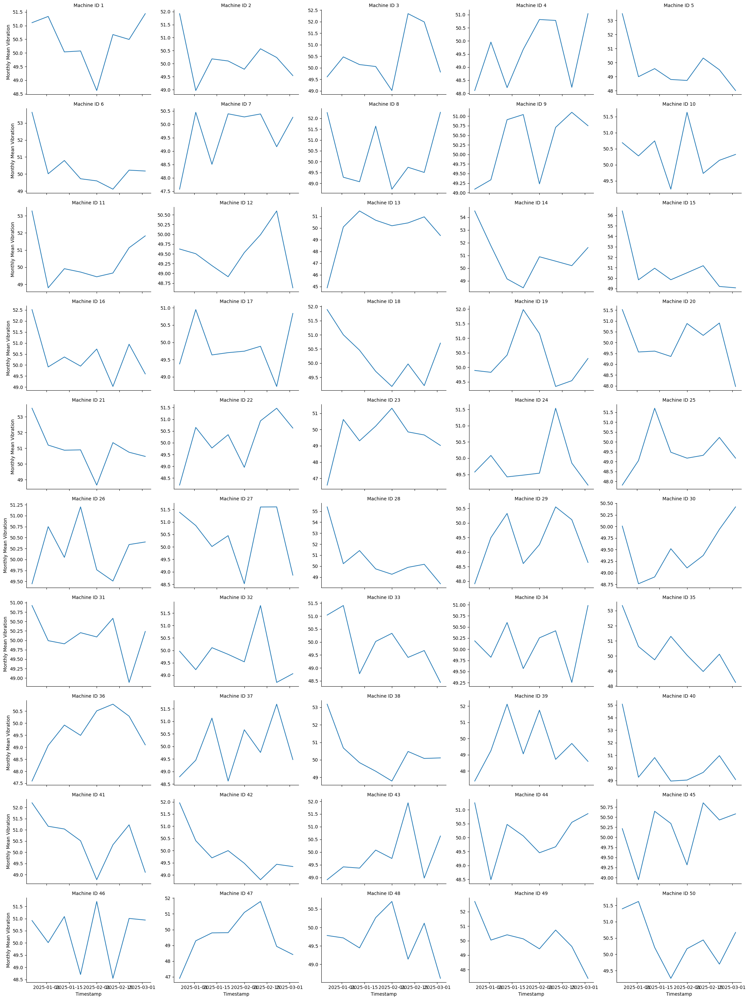

In [135]:
mean_vibration_for_equipments_monthly = df.group_by_dynamic(
    index_column=df['timestamp'],
    every='10d',
    group_by = 'machine_id' # Changed 'by' to 'group_by'
    ).agg(pl.col('vibration').mean().sort(descending=True).alias('mean_vibration'))

g = sns.relplot(
    data = mean_vibration_for_equipments_monthly,
    x= 'timestamp',
    y = 'mean_vibration',
    kind = 'line',
    col = 'machine_id',
    col_wrap = 5,
    facet_kws = {'sharey':False},
    height = 3,
    aspect = 1.5 )

g.set_titles()
g.set_titles("Machine ID {col_name}")
g.set_axis_labels("Timestamp", "Monthly Mean Vibration")
plt.tight_layout()
plt.show()

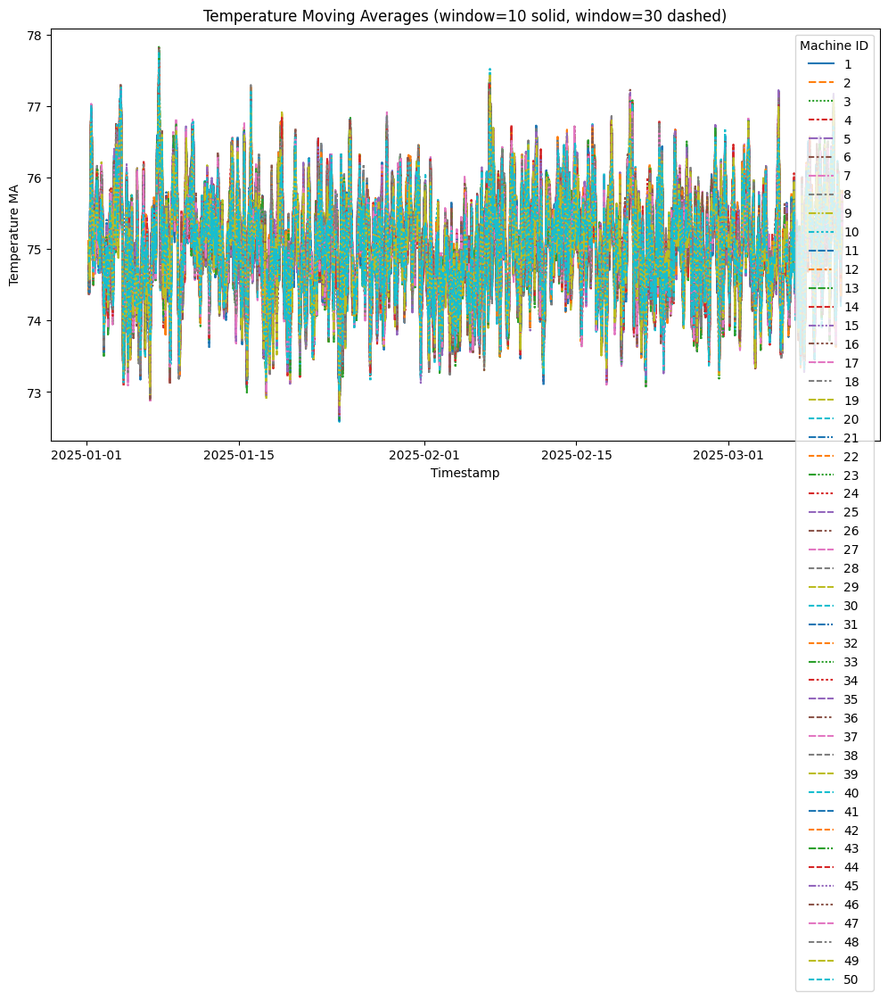

In [139]:
df_with_ma = df.with_columns([
    pl.col("temperature").rolling_mean(window_size=200).alias("temp_ma_10"),
    pl.col("temperature").rolling_mean(window_size=200).alias("temp_ma_30"),
    pl.col("vibration").rolling_mean(window_size=200).alias("vib_ma_10"),
    pl.col("vibration").rolling_mean(window_size=200).alias("vib_ma_30")
])

plt.figure(figsize=(12, 6))
sns.lineplot(data=df_with_ma, x='timestamp', y='temp_ma_10', hue='machine_id', style='machine_id', legend='full', palette='tab10')
sns.lineplot(data=df_with_ma, x='timestamp', y='temp_ma_30', hue='machine_id', style='machine_id', legend=False, palette='tab10', linestyle='--')
plt.title("Temperature Moving Averages (window=10 solid, window=30 dashed)")
plt.xlabel("Timestamp")
plt.ylabel("Temperature MA")
plt.legend(title="Machine ID")
plt.show()

<h3> checking top 5 machines with highest downtime risk</h3>

In [82]:
#checking top 5 machines with highest downtime risk
machine_downtime_risk = df.group_by('machine_id').agg(
    mean_downtime_risk = pl.col('downtime_risk').mean()
).sort(by = 'mean_downtime_risk')

# Print the first 5 rows
print(machine_downtime_risk.head(5))


shape: (5, 2)
┌────────────┬────────────────────┐
│ machine_id ┆ mean_downtime_risk │
│ ---        ┆ ---                │
│ i64        ┆ f64                │
╞════════════╪════════════════════╡
│ 20         ┆ 0.074112           │
│ 3          ┆ 0.076462           │
│ 16         ┆ 0.078602           │
│ 39         ┆ 0.078776           │
│ 13         ┆ 0.082353           │
└────────────┴────────────────────┘


<h3> which machine has the highest downtime risk</h3>

In [ ]:
df['downtime_risk'].describe()

statistic,value
str,f64
"""count""",100000.0
"""null_count""",0.0
"""mean""",0.0891552
"""std""",0.284961
"""min""",0.0
"""25%""",0.0
"""50%""",0.0
"""75%""",0.0
"""max""",1.0


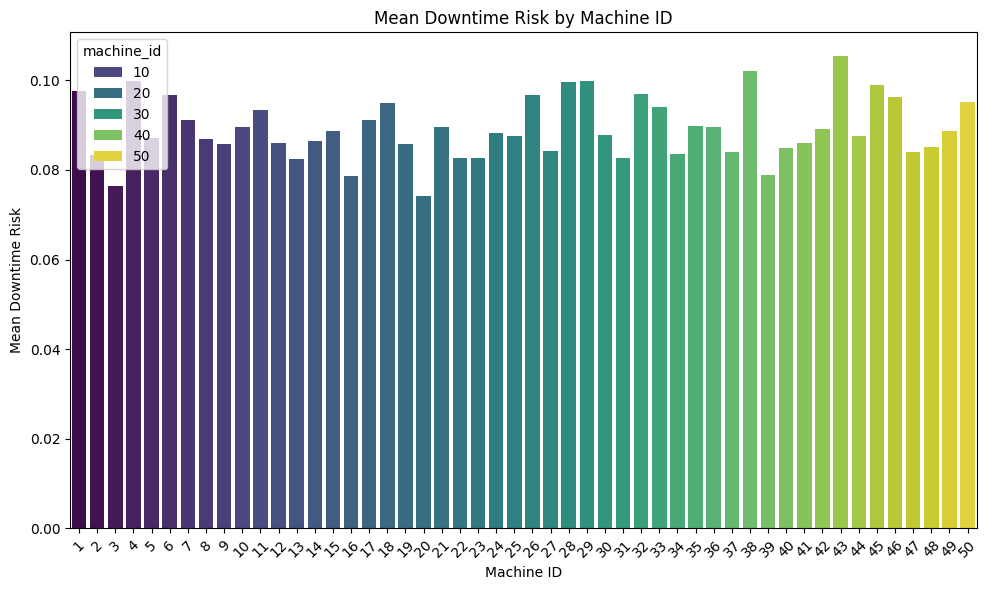

In [ ]:


fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(
    data = machine_downtime_risk.sort(by = 'mean_downtime_risk',descending=True),
    x = 'machine_id',
    y = 'mean_downtime_risk',
    hue = 'machine_id',
    palette = 'viridis',
    ax = ax
)
ax.set_title('Mean Downtime Risk by Machine ID')
ax.set_xlabel('Machine ID')
ax.set_ylabel('Mean Downtime Risk')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [89]:
#checking top 5 machines with highest downtime risk
machine_downtime_risk = df.group_by('machine_id').agg(
    mean_downtime_risk = pl.col('downtime_risk').mean()
).sort(by = 'mean_downtime_risk')

# Print the first 5 rows
print(machine_downtime_risk.head(5))

shape: (5, 2)
┌────────────┬────────────────────┐
│ machine_id ┆ mean_downtime_risk │
│ ---        ┆ ---                │
│ i64        ┆ f64                │
╞════════════╪════════════════════╡
│ 20         ┆ 0.074112           │
│ 3          ┆ 0.076462           │
│ 16         ┆ 0.078602           │
│ 39         ┆ 0.078776           │
│ 13         ┆ 0.082353           │
└────────────┴────────────────────┘


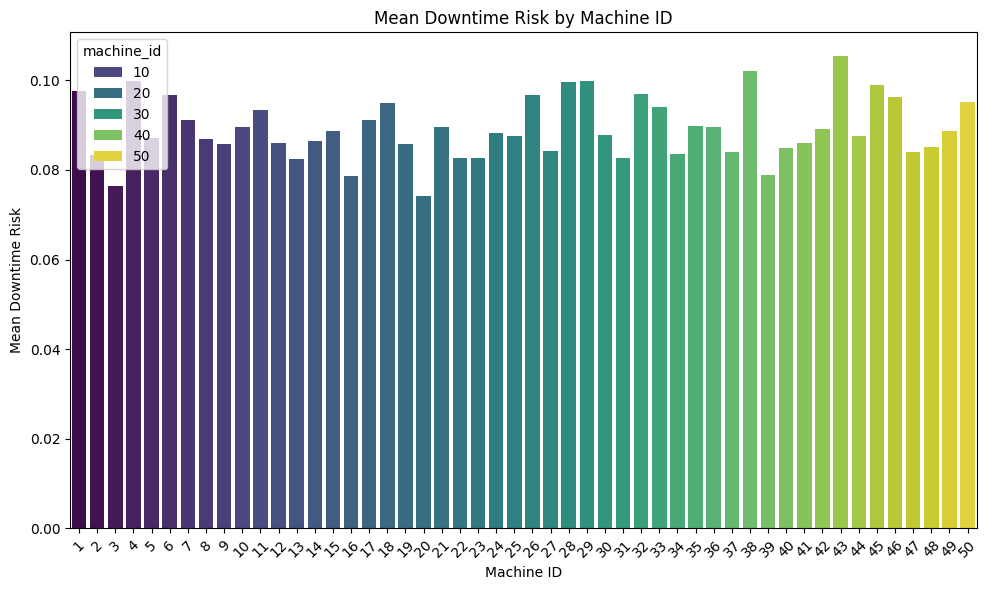

In [91]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(
    data = machine_downtime_risk.sort(by = 'mean_downtime_risk',descending=False),
    x = 'machine_id',
    y = 'mean_downtime_risk',
    hue = 'machine_id',
    palette = 'viridis',
    ax = ax
)
ax.set_title('Mean Downtime Risk by Machine ID')
ax.set_xlabel('Machine ID')
ax.set_ylabel('Mean Downtime Risk')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [66]:
#checking if time stamp has irregular gaps somewhere 

df.with_columns(
    pl.col("timestamp").diff().alias("time_diff").shift(-1)
).filter(pl.col("time_diff") != pl.duration(minutes=1))



timestamp,machine_id,temperature,vibration,humidity,pressure,energy_consumption,machine_status,anomaly_flag,predicted_remaining_life,failure_type,downtime_risk,maintenance_required,time_diff
datetime[μs],i64,f64,f64,f64,f64,f64,i64,i64,i64,str,f64,i64,duration[μs]


In [67]:
df.unique('machine_status').get_column('machine_status')

machine_status
i64
0
1
2


In [68]:
#reason for machine failure
df.unique('failure_type').get_column('failure_type')


failure_type
str
"""Pressure Drop"""
"""Vibration Issue"""
"""Normal"""
"""Overheating"""
"""Electrical Fault"""


In [69]:
df_failure_type_count = df.group_by("failure_type").agg(
    pl.count().alias("failure_count")
)
print(df_failure_type_count)

shape: (5, 2)
┌──────────────────┬───────────────┐
│ failure_type     ┆ failure_count │
│ ---              ┆ ---           │
│ str              ┆ u32           │
╞══════════════════╪═══════════════╡
│ Overheating      ┆ 1989          │
│ Vibration Issue  ┆ 3129          │
│ Pressure Drop    ┆ 1969          │
│ Electrical Fault ┆ 1014          │
│ Normal           ┆ 91899         │
└──────────────────┴───────────────┘


/var/folders/9m/fk8nf0sd56b7drjkrkbjx7580000gn/T/ipykernel_66800/353800852.py:2: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  pl.count().alias("failure_count")


<h3> faulure type count </h3>

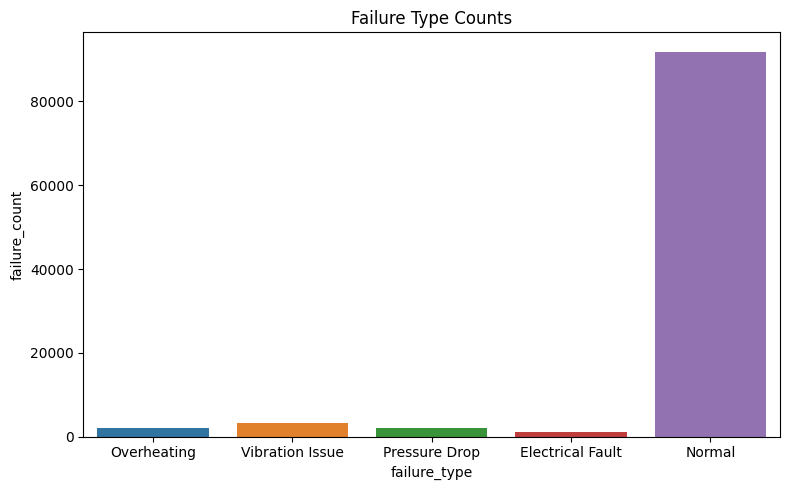

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))  

sns.barplot(
    data=df_failure_type_count.to_pandas(),  # Polars DataFrame converted to pandas
    x='failure_type',
    y='failure_count',
    hue='failure_type',
    ax=ax,
    legend='auto'
)

ax.set_title('Failure Type Counts')
plt.tight_layout()
plt.show()


In [107]:
df.columns

['timestamp',
 'machine_id',
 'temperature',
 'vibration',
 'humidity',
 'pressure',
 'energy_consumption',
 'machine_status',
 'anomaly_flag',
 'predicted_remaining_life',
 'failure_type',
 'downtime_risk',
 'maintenance_required']

In [110]:
df['machine_status'].value_counts()

machine_status,count
i64,u32
1,80091
0,9852
2,10057


[]

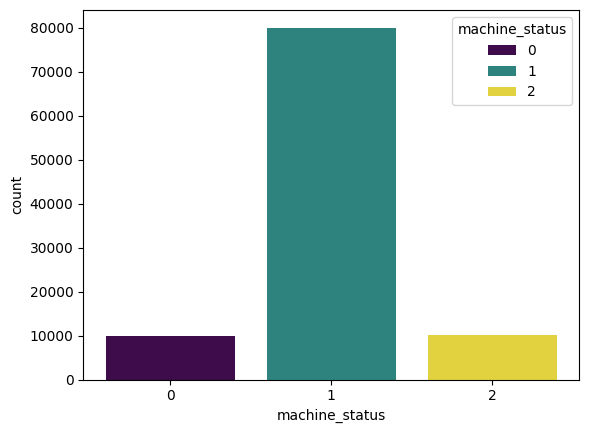

In [115]:
sns.barplot(df['machine_status'].value_counts(),
            x = 'machine_status',
            y = 'count',
            palette = 'viridis',
            hue = 'machine_status',
            
)

ax.set_title('Machine Status Counts')
ax.set_xlabel('Machine Status')
ax.set_ylabel('Count')
plt.plot()
            

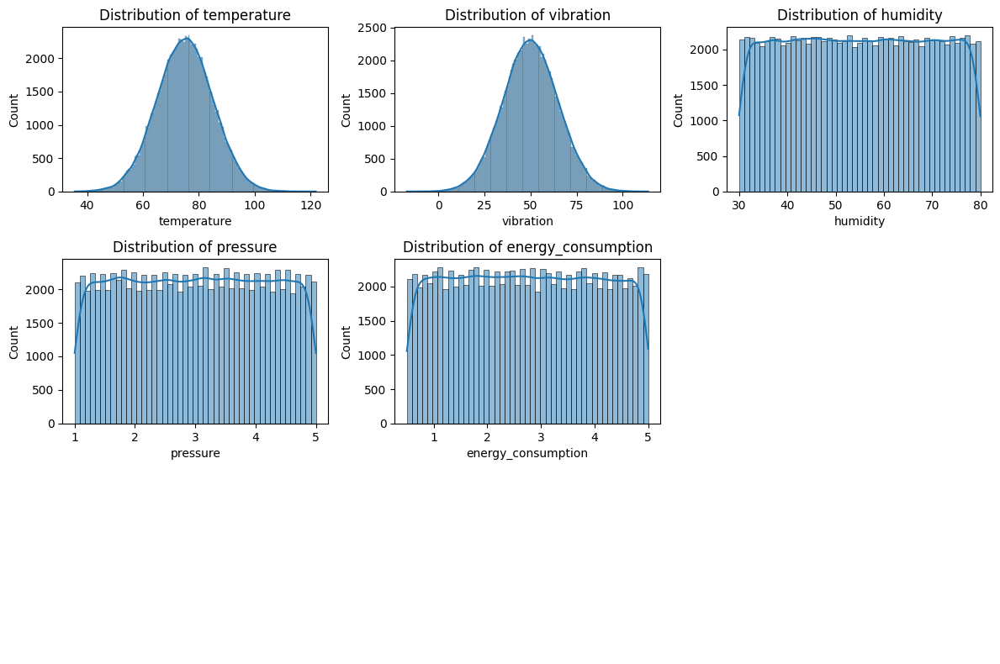

In [71]:

sensor_columns = ['temperature', 'vibration', 'humidity', 'pressure', 'energy_consumption']

fig, axis = plt.subplots(nrows=3, ncols=3, figsize=(12, 8))
axis = axis.flatten()  # Flatten to 1D array for easy indexing

for i, col in enumerate(sensor_columns):
    sns.histplot(data=df.to_pandas(), x=col, ax=axis[i], kde=True)
    axis[i].set_title(f"Distribution of {col}")

# Turn off extra empty plots
for j in range(len(sensor_columns), len(axis)):
    axis[j].axis('off')

plt.tight_layout()
plt.show()

In [92]:
df['pressure'].describe()

statistic,value
str,f64
"""count""",100000.0
"""null_count""",0.0
"""mean""",3.0004047
"""std""",1.152399
"""min""",1.0
"""25%""",2.0
"""50%""",3.01
"""75%""",4.0
"""max""",5.0


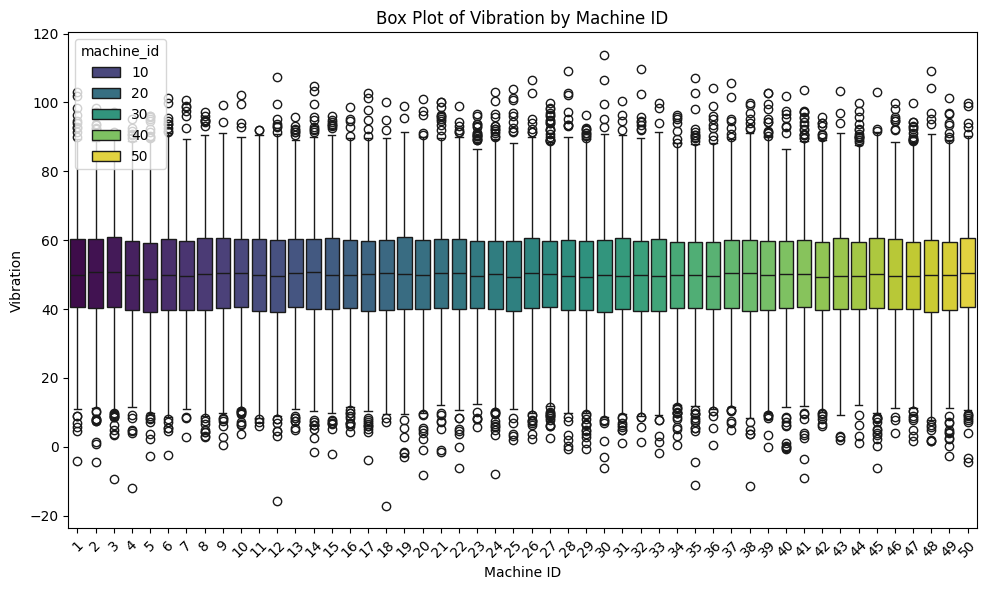

In [96]:
#lets try box plot for vibration and temperature 

fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(
    data = df,
    x = 'machine_id',
    y = 'vibration',
    hue = 'machine_id',
    palette = 'viridis',
    ax = ax,
    
)

ax.set_title('Box Plot of Vibration by Machine ID')
ax.set_xlabel('Machine ID')
ax.set_ylabel('Vibration')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


- most of the machines have a similar vibration pattern 
- there are definetly some outliers 
- there are some machines with high vibration and temperature 
- there are some machines with low vibration and temperature 
- there are some machines with high vibration and temperature 
- next is to uncover some pattern in failure data 


which columns contribute most to a machine being down 



In [124]:
import pandas as pd
df_pandas = df.to_pandas()
df_encoded = pd.get_dummies(df_pandas)
df_encoded.corr()['machine_status'].sort_values(ascending=False)

print(df_encoded.corr())



                               timestamp  machine_id  temperature  vibration  \
timestamp                       1.000000    0.002031     0.000879  -0.002478   
machine_id                      0.002031    1.000000     0.003499  -0.003065   
temperature                     0.000879    0.003499     1.000000  -0.003251   
vibration                      -0.002478   -0.003065    -0.003251   1.000000   
humidity                        0.000724    0.000397     0.002555   0.006051   
pressure                        0.000119    0.003067    -0.001116  -0.000278   
energy_consumption             -0.007198   -0.003678     0.003259   0.007897   
machine_status                  0.001853    0.002512    -0.000492   0.002787   
anomaly_flag                    0.003169    0.003287     0.446987   0.177386   
predicted_remaining_life       -0.002164   -0.001999    -0.192581  -0.076073   
downtime_risk                   0.003171    0.003282     0.446980   0.177452   
maintenance_required            0.001797

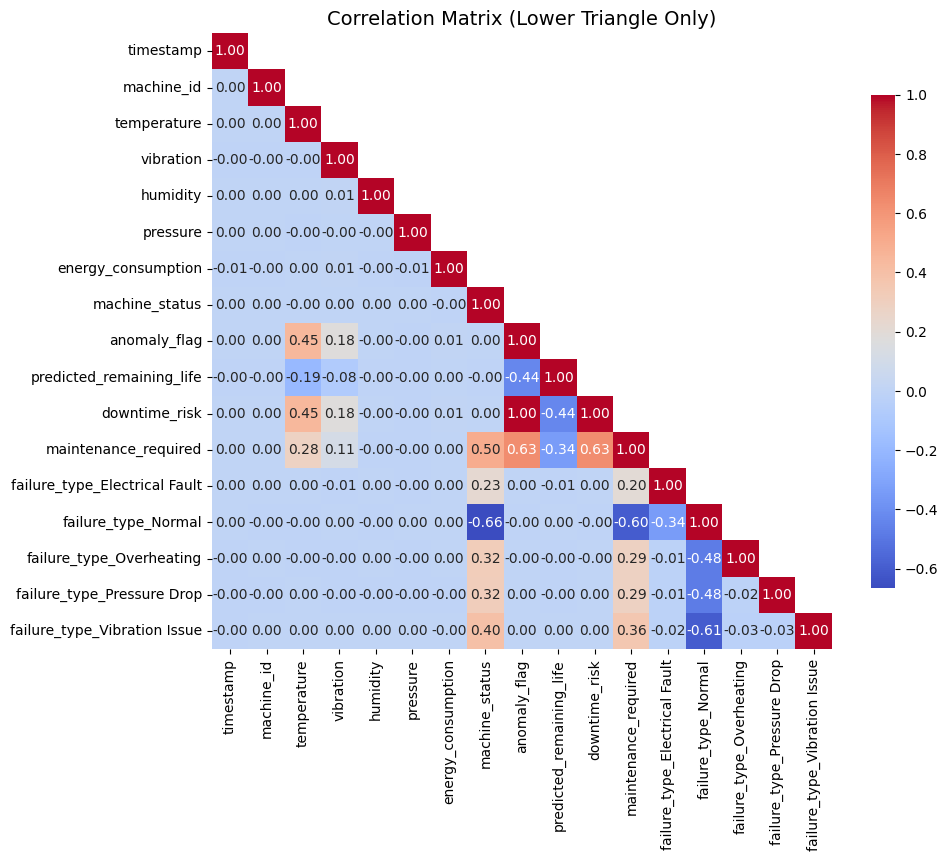

In [128]:
import numpy as np
plt.figure(figsize=(10,8))
mask = np.triu(np.ones(df_encoded.corr().shape), k=1)


sns.heatmap(df_encoded.corr(),mask = mask, cmap='coolwarm', annot=True, fmt=".2f", square=False, cbar_kws={"shrink": .8})
plt.title("Correlation Matrix (Lower Triangle Only)", fontsize=14)
plt.show()

In [ ]:
columns_to_plot = ['vibration', 'temperature', 'pressure', 'humidity', 'energy_consumption']
machine_samples = df['machine_id'].sample(5)
for colum in machine_samples:
    sns.barplot(df[].value_counts(),



In [116]:
df.filter(
    (pl.col('machine_id') == 1) & (pl.col('machine_status') != 0)
).select(columns_to_plot)

vibration,temperature,pressure,humidity,energy_consumption
f64,f64,f64,f64,f64
48.08,62.59,1.62,60.13,4.16
68.67,70.88,1.05,50.57,2.36
72.68,62.34,2.24,60.47,4.95
53.36,88.03,3.08,50.79,2.25
49.44,79.39,2.54,56.99,2.76
…,…,…,…,…
55.56,65.94,3.19,56.66,1.89
71.87,81.92,3.57,50.48,4.02
49.27,76.05,3.53,30.21,3.21


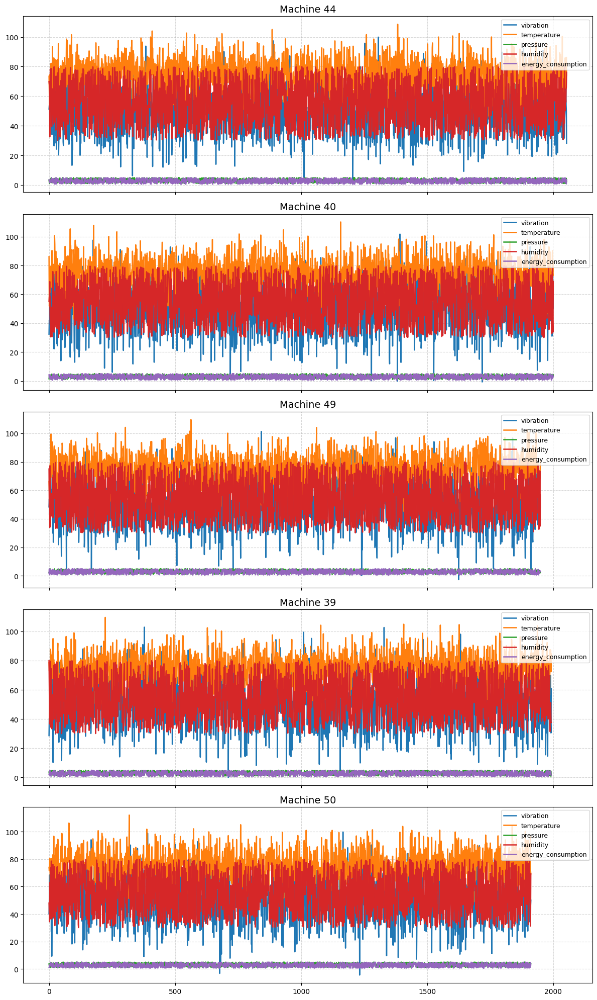

In [129]:
columns_to_plot = ['vibration', 'temperature', 'pressure', 'humidity', 'energy_consumption']
machine_samples = df['machine_id'].unique().to_list()
machine_samples = np.random.choice(machine_samples, 5, replace=False)  # 5 unique machines

fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 20), sharex=True)

for idx, sample in enumerate(machine_samples):
    df_sample = (
        df.filter(pl.col('machine_id') == sample)
          .select(columns_to_plot)
          .to_pandas()
    )
    df_sample.plot(ax=axes[idx], kind='line', lw=1.8)
    axes[idx].set_title(f'Machine {sample}', fontsize=14)
    axes[idx].grid(True, linestyle='--', alpha=0.5)
    axes[idx].legend(loc='upper right', fontsize=9)
    
plt.tight_layout()
plt.show()

#insights
- bell shape distribution for vibration  and temperture indicates normal distribution and not skewed 
- pressure and energy consumption are almost linear indicating values too close to each other 

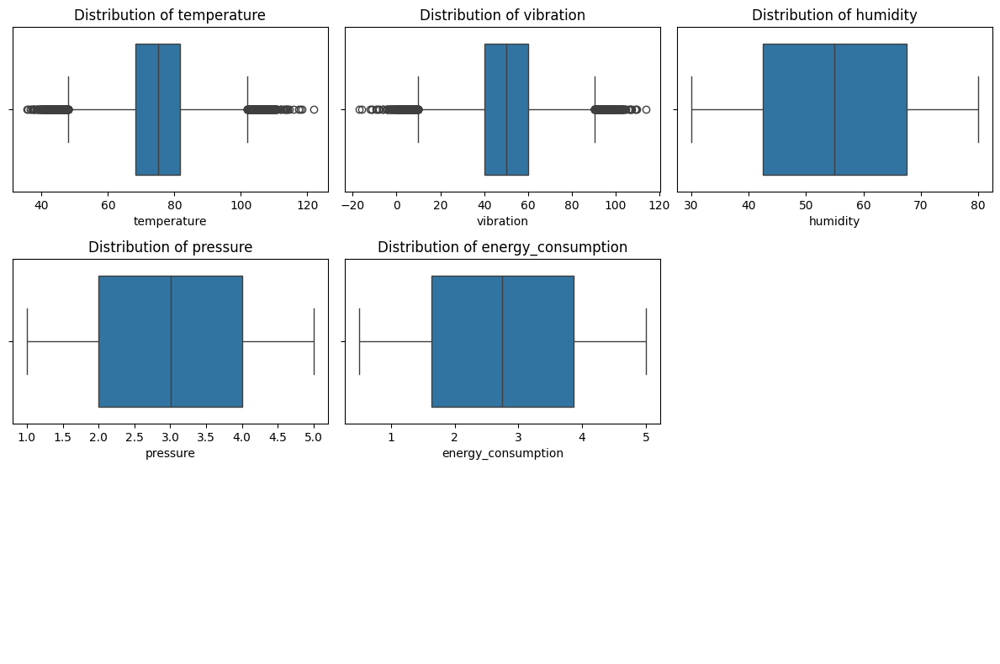

In [72]:
sensor_columns = ['temperature', 'vibration', 'humidity', 'pressure', 'energy_consumption']

fig, axis = plt.subplots(nrows=3, ncols=3, figsize=(12, 8))
axis = axis.flatten()  

for i, col in enumerate(sensor_columns):
    sns.boxplot(data=df.to_pandas(), x=col, ax=axis[i])
    axis[i].set_title(f"Distribution of {col}")

# Turn off extra empty plots
for j in range(len(sensor_columns), len(axis)):
    axis[j].axis('off')

plt.tight_layout()
plt.show()

/var/folders/9m/fk8nf0sd56b7drjkrkbjx7580000gn/T/ipykernel_66800/967391740.py:3: DeprecationWarning: the argument `by` for `DataFrame.group_by_dynamic` is deprecated. It was renamed to `group_by` in version 0.20.14.
  .group_by_dynamic("timestamp", every="1h", period="24h", by="machine_id")


<Axes: xlabel='timestamp'>

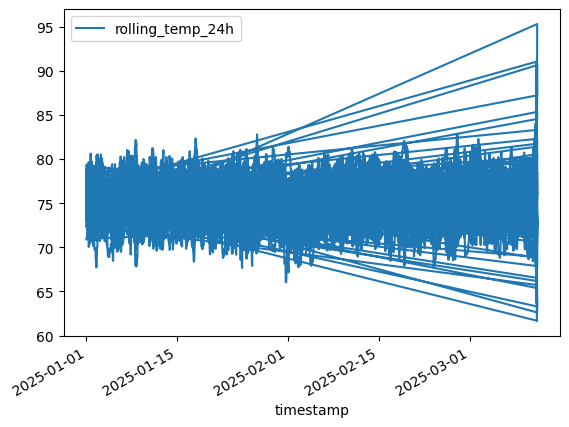

In [73]:



rolling_temp = (
    df
    .group_by_dynamic("timestamp", every="1h", period="24h", by="machine_id")
    .agg([
        pl.col("temperature").mean().alias("rolling_temp_24h")
    ])
)

rolling_temp.to_pandas().plot(x='timestamp', y='rolling_temp_24h')

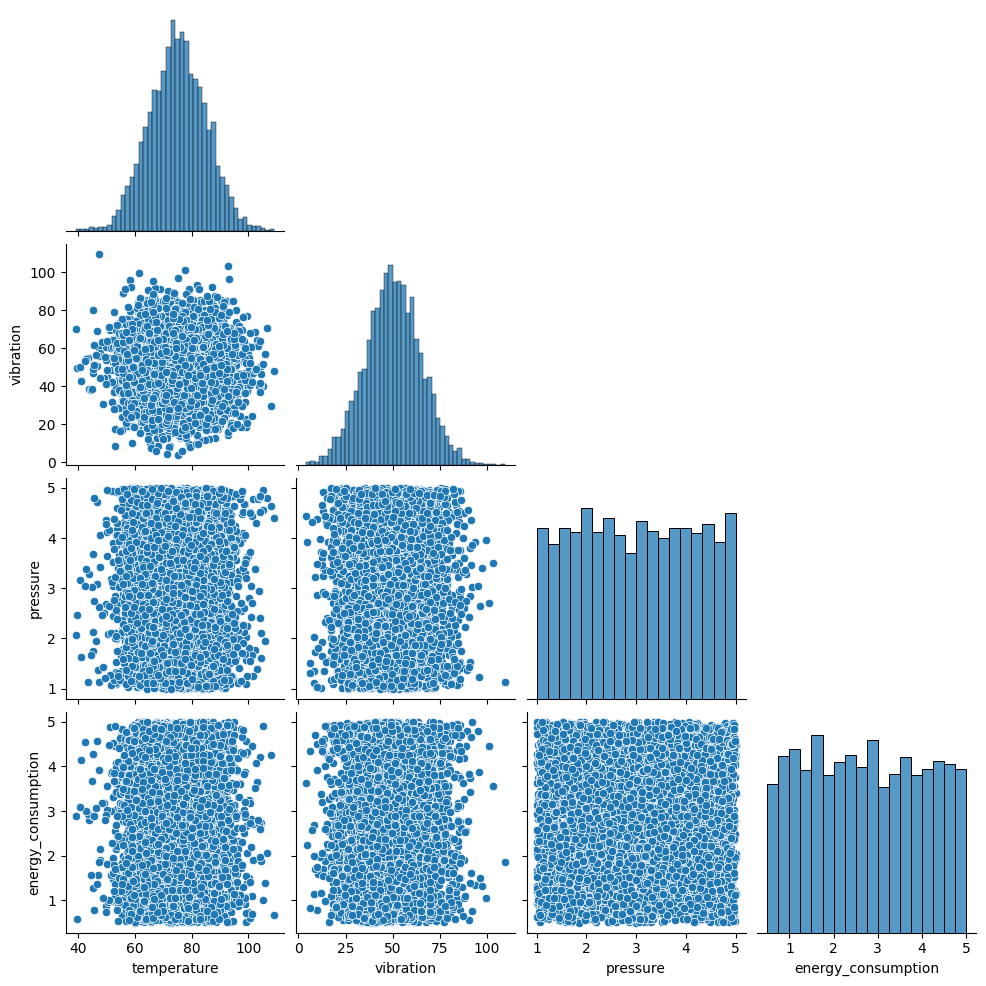

In [74]:
df_sample = df.sample(5000).to_pandas()

import seaborn as sns
sns.pairplot(df_sample[['temperature', 'vibration', 'pressure', 'energy_consumption']], corner=True)

In [75]:
pip install statsmodels


[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [76]:
import random
random.seed = 42

[5, 28, 23, 21, 29, 34, 49, 31, 39, 48]


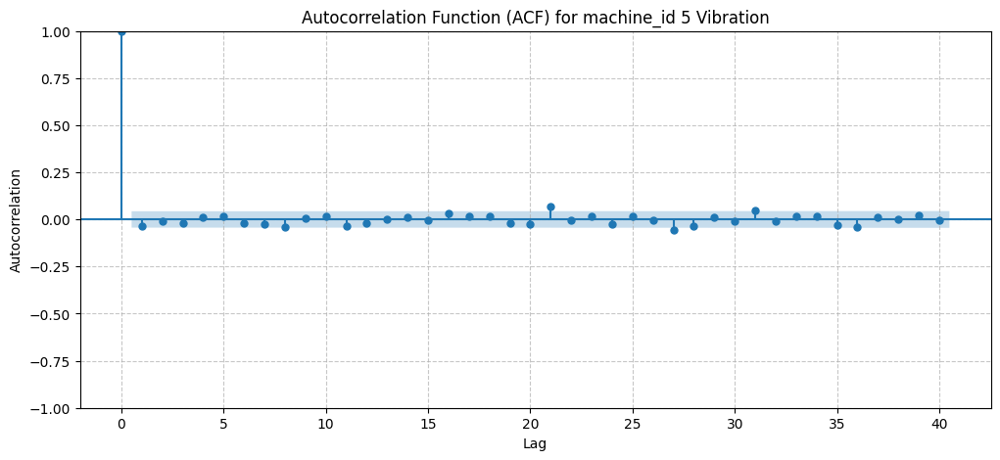

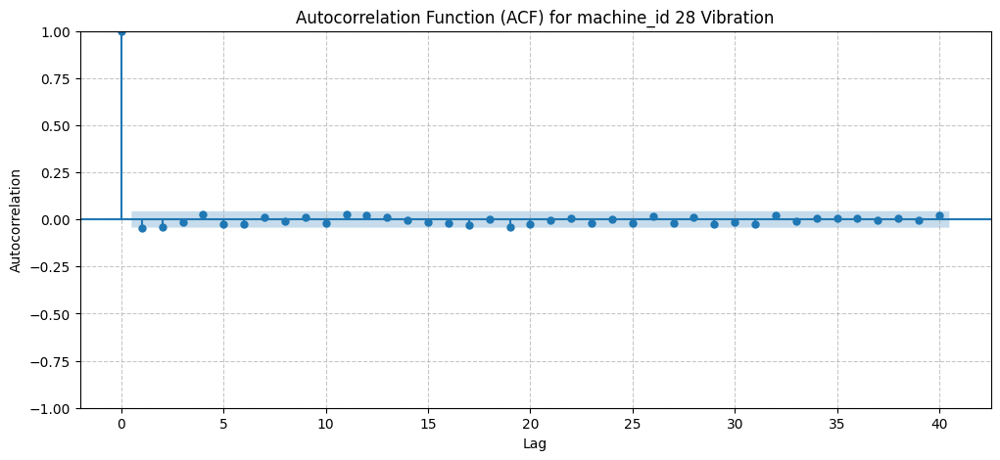

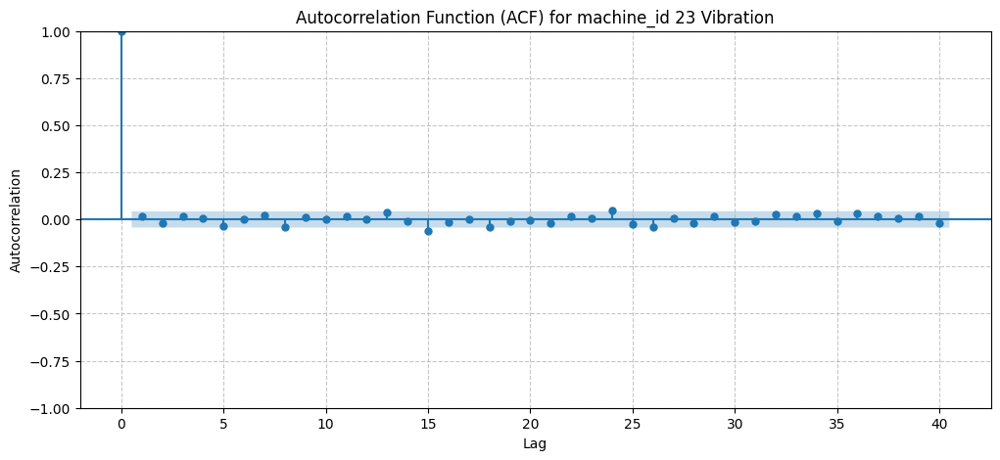

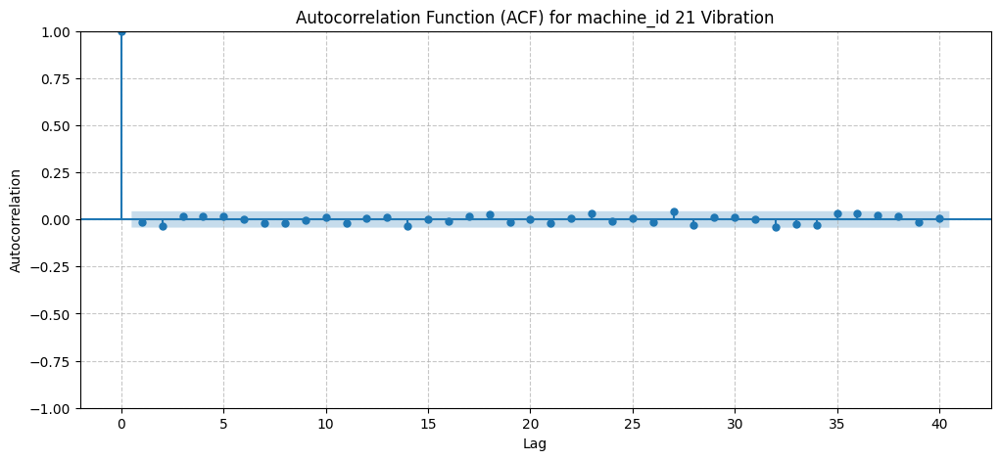

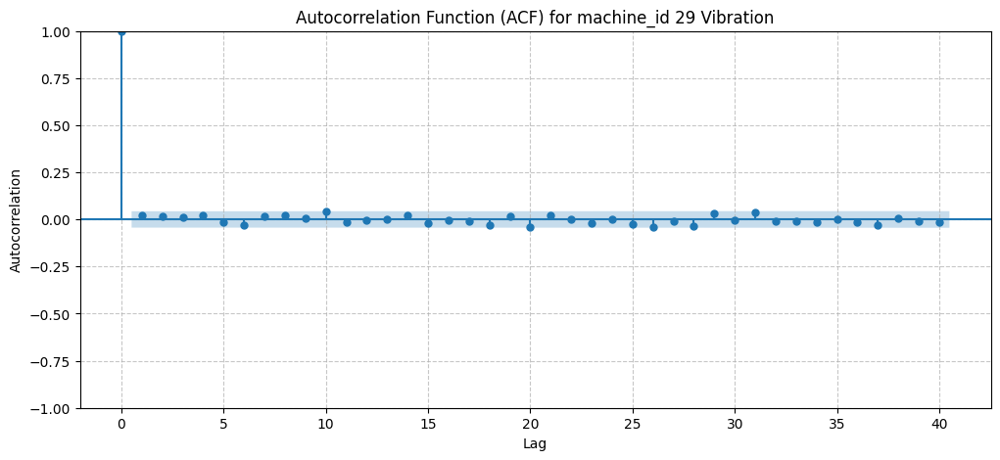

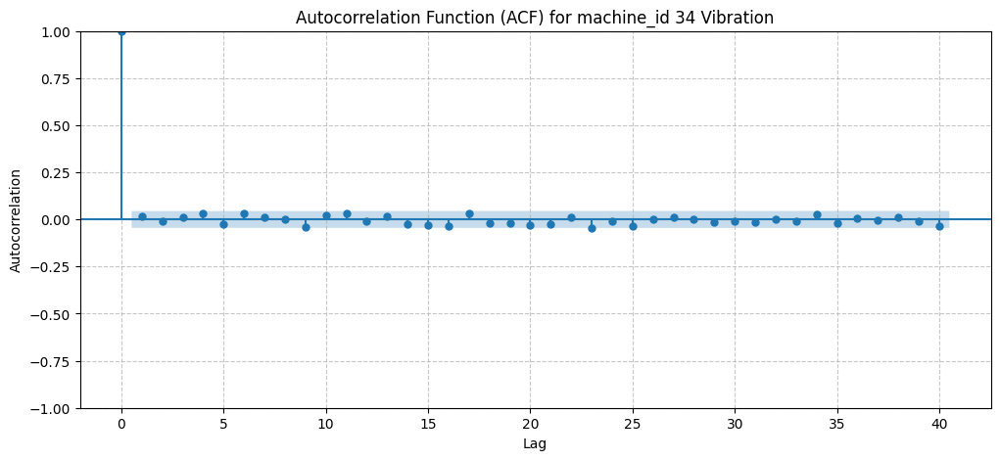

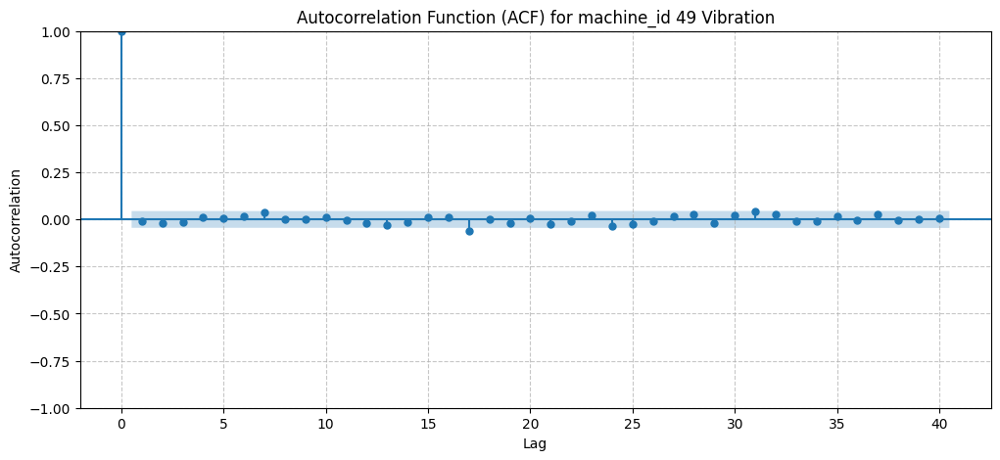

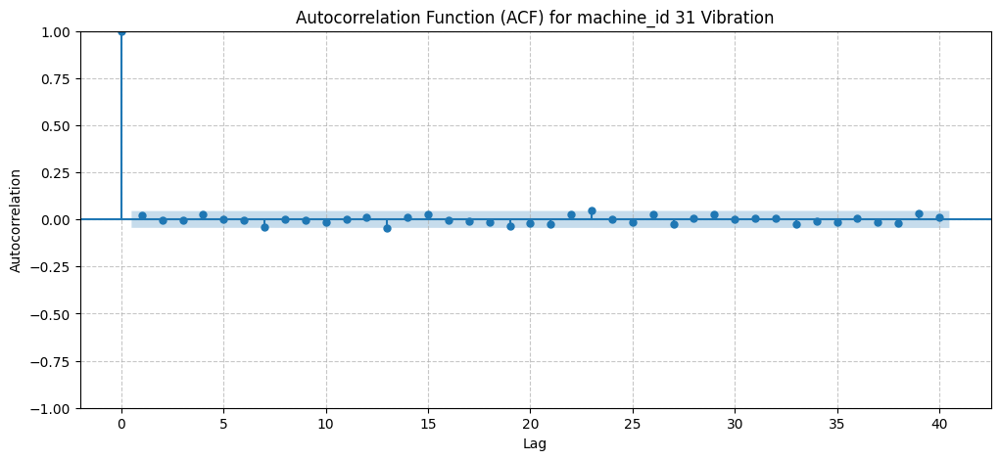

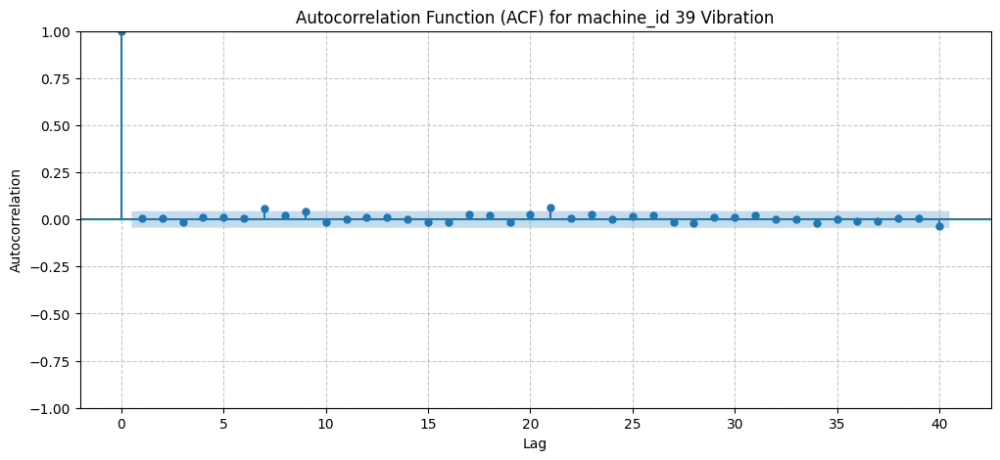

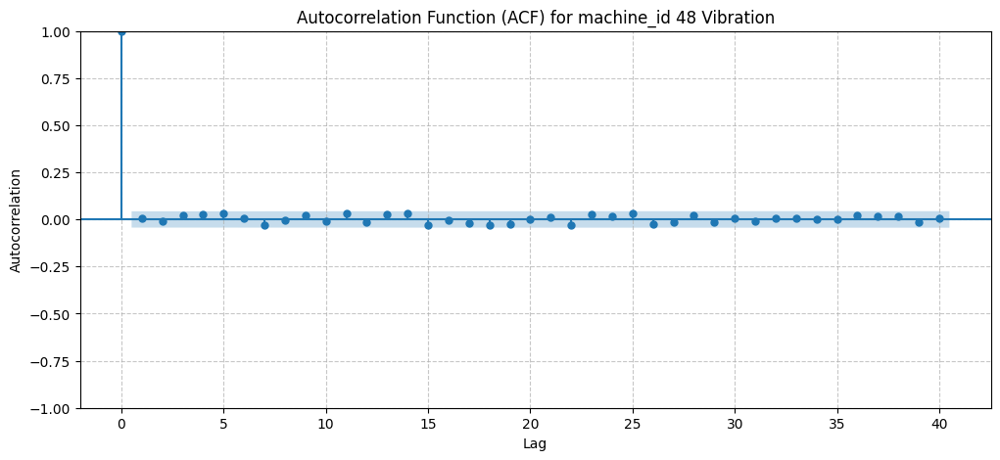

In [77]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
machine_samples = random.sample(list(df['machine_id']),k = 10)
print(machine_samples)
for machine in machine_samples:
    single_machine_data = df.filter(pl.col('machine_id') == machine).sort('timestamp')

# Convert the relevant column to a Pandas Series for statsmodels
# Make sure the timestamp is the index for time series plots
    time_series_data = single_machine_data.to_pandas().set_index('timestamp')['vibration']

    # Plot ACF
    plt.figure(figsize=(12, 5))
    plot_acf(time_series_data, lags=40, ax=plt.gca()) # lags specifies how many lags to compute
    plt.title(f'Autocorrelation Function (ACF) for machine_id {machine} Vibration')
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

# anomaly analysis
# what happens before anomalies ?
# Look at sensor trends leading up to anomaly_flag = 1



In [ ]:
df['downtime_risk'].describe()

statistic,value
str,f64
"""count""",100000.0
"""null_count""",0.0
"""mean""",0.0891552
"""std""",0.284961
"""min""",0.0
"""25%""",0.0
"""50%""",0.0
"""75%""",0.0
"""max""",1.0


In [ ]:
df['downtime_risk'].describe()

statistic,value
str,f64
"""count""",100000.0
"""null_count""",0.0
"""mean""",0.0891552
"""std""",0.284961
"""min""",0.0
"""25%""",0.0
"""50%""",0.0
"""75%""",0.0
"""max""",1.0


In [174]:
df_anomaly = df.filter(pl.col('anomaly_flag') == 1)

df_anomaly_grouped_vibration = (
    df_anomaly.group_by_dynamic(
        index_column='timestamp',
        every='1d',
        by='machine_id'
    )
    .agg(
        pl.col('vibration').mean().alias('mean_vibration')
    )
    .sort('mean_vibration', descending=True)  # Sorting happens AFTER aggregation
)
print(df_anomaly_grouped_vibration)

shape: (3_185, 3)
┌────────────┬─────────────────────┬────────────────┐
│ machine_id ┆ timestamp           ┆ mean_vibration │
│ ---        ┆ ---                 ┆ ---            │
│ i64        ┆ datetime[μs]        ┆ f64            │
╞════════════╪═════════════════════╪════════════════╡
│ 14         ┆ 2025-02-05 00:00:00 ┆ 104.74         │
│ 36         ┆ 2025-01-03 00:00:00 ┆ 104.08         │
│ 32         ┆ 2025-02-04 00:00:00 ┆ 102.56         │
│ 49         ┆ 2025-01-31 00:00:00 ┆ 101.3          │
│ 50         ┆ 2025-02-12 00:00:00 ┆ 99.84          │
│ …          ┆ …                   ┆ …              │
│ 49         ┆ 2025-03-01 00:00:00 ┆ 9.03           │
│ 2          ┆ 2025-02-09 00:00:00 ┆ 8.11           │
│ 17         ┆ 2025-01-13 00:00:00 ┆ 7.2            │
│ 2          ┆ 2025-02-13 00:00:00 ┆ 0.74           │
│ 50         ┆ 2025-01-25 00:00:00 ┆ -3.28          │
└────────────┴─────────────────────┴────────────────┘


/var/folders/9m/fk8nf0sd56b7drjkrkbjx7580000gn/T/ipykernel_66800/2757740559.py:4: DeprecationWarning: the argument `by` for `DataFrame.group_by_dynamic` is deprecated. It was renamed to `group_by` in version 0.20.14.
  df_anomaly.group_by_dynamic(


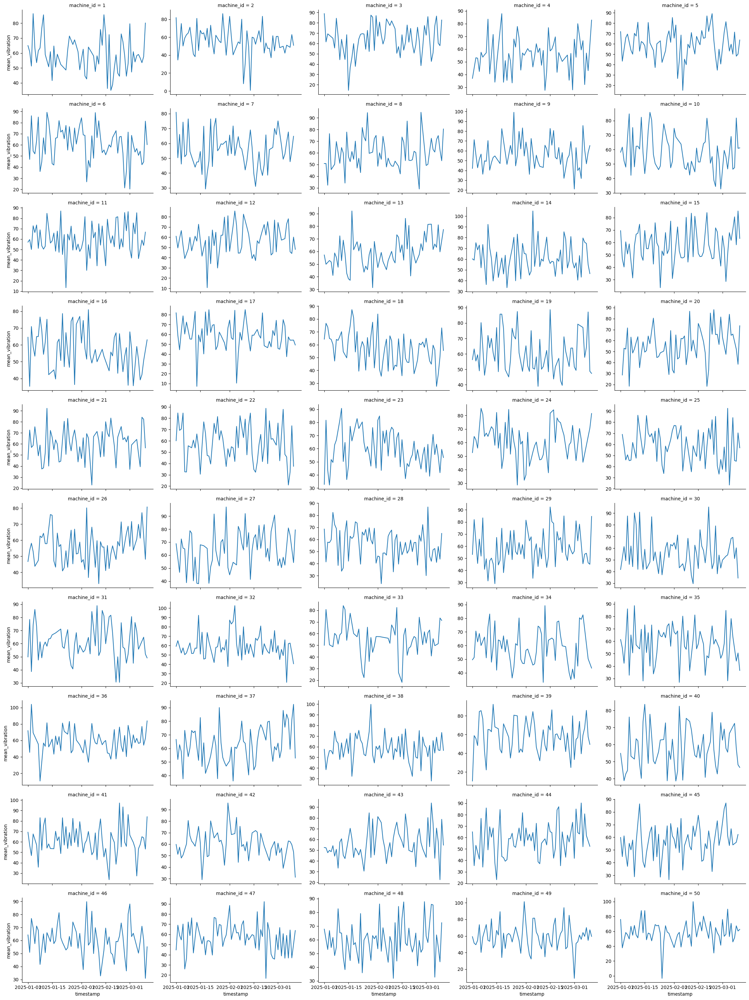

In [177]:
sns.relplot(
    data = df_anomaly_grouped_vibration,
    x = 'timestamp',
    y = 'mean_vibration',
    kind = 'line',
    col = 'machine_id',
    col_wrap = 5,
    facet_kws = {'sharey':False},
    height = 3,
    aspect = 1.5 )

In [175]:
df_anomaly_grouped_temperature = (
    df_anomaly.group_by_dynamic(
        index_column='timestamp',
        every='1d',
        by='machine_id'
    )
    .agg(
        pl.col('temperature').mean().alias('mean_temperature')
    )
    .sort('mean_temperature', descending=True)  # Sorting happens AFTER aggregation
)
print(df_anomaly_grouped_temperature)

shape: (3_185, 3)
┌────────────┬─────────────────────┬──────────────────┐
│ machine_id ┆ timestamp           ┆ mean_temperature │
│ ---        ┆ ---                 ┆ ---              │
│ i64        ┆ datetime[μs]        ┆ f64              │
╞════════════╪═════════════════════╪══════════════════╡
│ 47         ┆ 2025-01-18 00:00:00 ┆ 110.92           │
│ 18         ┆ 2025-03-04 00:00:00 ┆ 110.69           │
│ 30         ┆ 2025-01-15 00:00:00 ┆ 109.84           │
│ 46         ┆ 2025-02-26 00:00:00 ┆ 109.23           │
│ 5          ┆ 2025-01-25 00:00:00 ┆ 108.6            │
│ …          ┆ …                   ┆ …                │
│ 41         ┆ 2025-03-11 00:00:00 ┆ 53.13            │
│ 49         ┆ 2025-01-31 00:00:00 ┆ 49.65            │
│ 41         ┆ 2025-02-12 00:00:00 ┆ 49.63            │
│ 48         ┆ 2025-02-13 00:00:00 ┆ 46.31            │
│ 39         ┆ 2025-01-06 00:00:00 ┆ 42.55            │
└────────────┴─────────────────────┴──────────────────┘


/var/folders/9m/fk8nf0sd56b7drjkrkbjx7580000gn/T/ipykernel_66800/782984589.py:2: DeprecationWarning: the argument `by` for `DataFrame.group_by_dynamic` is deprecated. It was renamed to `group_by` in version 0.20.14.
  df_anomaly.group_by_dynamic(


In [178]:
df.sort('timestamp')
pre_anomaly_data = []
for anomaly_time in df.filter(pl.col('anomaly_flag') == 1)['timestamp'].unique():
    window = df.filter(
        (pl.col('timestamp') >= anomaly_time - pl.duration(days=1)) & 
        (pl.col('timestamp') < anomaly_time)
    )
    pre_anomaly_data.append(window)